In [1]:
from collections import Counter
from collections import defaultdict
import itertools
import sys
import time
import json
import configparser
from TwitterAPI import TwitterAPI
import networkx as nx
from networkx.algorithms import community as nxcommunity
import community
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
import pickle
warnings.filterwarnings("ignore")

In [ ]:
def read_screen_names(filename):
    """
    Read a text file containing Twitter screen_names, one per line.

    Params:
        filename....Name of the file to read.
    Returns:
        A list of strings, one per screen_name, in the order they are listed
        in the file.

    Here's a doctest to confirm your implementation is correct.
    >>> read_screen_names('candidates.txt')
    ['DrJillStein', 'GovGaryJohnson', 'HillaryClinton', 'realDonaldTrump']
    """
    file = open(filename)
    r = sorted([l.strip() for l in file])
    file.close()
    return r

initial_screen_names = read_screen_names('data/collect/ethereum-accounts.txt')
print('Read screen names: %s' % initial_screen_names)

In [2]:
users = pickle.load(open('../data/collect/users.json', 'rb'))
louvian_dict = pickle.load(open('../data/cluster/community-detection-louvian.pkl', 'rb'))
greedy_mod_dict = pickle.load(open('../data/cluster/community-detection-greedy-modularity.pkl', 'rb'))
data = pickle.load(open('../data/cluster/graph-nodesLabeled.pkl', 'rb'))
graph = data[0]
nodes_with_labels = data[1]

In [5]:
print('graph has %s nodes and %s edges' % (len(graph.nodes()), len(graph.edges())))
print(len(nodes_with_labels))

graph has 1662 nodes and 5552 edges
17


In [6]:
def draw_network_communities(graph, node2cluster_dict, initial_screen_names, nodes_labeled, filename):
    """
    Draw the communities of a network to a file. Only label the candidate nodes and top 100 most common ids; the friend and followers
    nodes should have no labels (to reduce clutter).

    Each community will have a different color
    
    Args:
      graph..........................The networkx graph to draw.
      node2cluusterdict..............A dict from node to number of cluster ot which it belongs.
      initial_screen_names...........The list of the ethreum accounts we started the project with.
      nodes_labeled..................The list of nodes that should have a label in the drawing.
      filename.......................The name of the file to store the image.
    Returns:
      Nothing. (Perists the image into a file)
    """
    spring_pos = nx.spring_layout(graph)
    nodes = list(graph.nodes())
    sizes = [1000] * len(nodes)
    labels = {}
    for node in graph.nodes():
        if node in nodes_labeled:
            labels[node] = node
            idx = nodes.index(node)
            if node in initial_screen_names:
                sizes[idx] = 7000
            else:
                sizes[idx] = 2500
    community_values = [node2cluster_dict.get(node) for node in graph.nodes()]
    fig = plt.figure(figsize=(60,60))
    plt.axis("off")
    nx.draw_networkx(graph, pos = spring_pos, cmap = plt.get_cmap("jet"), node_color = community_values, node_size = sizes, labels=labels, font_color='gold', font_size=40, font_weight='bold')
    #fig.savefig(filename, dpi=fig.dpi)

In [7]:
def print_comm_summary(node2cluster_dict, nodes_labeled):
    """
    Print a summary of the clustering. Print all the different clusters and the members of the clusters that
    are part of the main nodes.

    Params:
        node2cluuster_dict....A dict that matches each node to the cluster they belong to.
        nodes_labeled.........The list of nodes that contains the main clusters.
    Returns:
        Nothing. (Only prints)

    """
    print("Partition of main nodes obtained by the Louvain Algorithm:")
    num_part = max(node2cluster_dict.values()) + 1
    print("Total number of partitions %d" % num_part)
    for comm_i in range(num_part):
        comm = [node for node, value in node2cluster_dict.items() if value == comm_i and node in nodes_with_labels]
        print("Community %d formed by %s" % (comm_i,comm))

Louvain Algorithm Clustering:
Partition of main nodes obtained by the Louvain Algorithm:
Total number of partitions 3
Community 0 formed by ['ConsenSysAcad', '3879800793', '913131503667859456', 'gavofyork', 'trufflesuite']
Community 1 formed by ['1102918561339711489', '166021378', '2493743604', '965720461274267648', '1075046092612530177', '1118943462223536128', '1119491594137350144']
Community 2 formed by ['VitalikButerin', '1119509750322999296', 'binance', 'coinbase', 'ethereum']


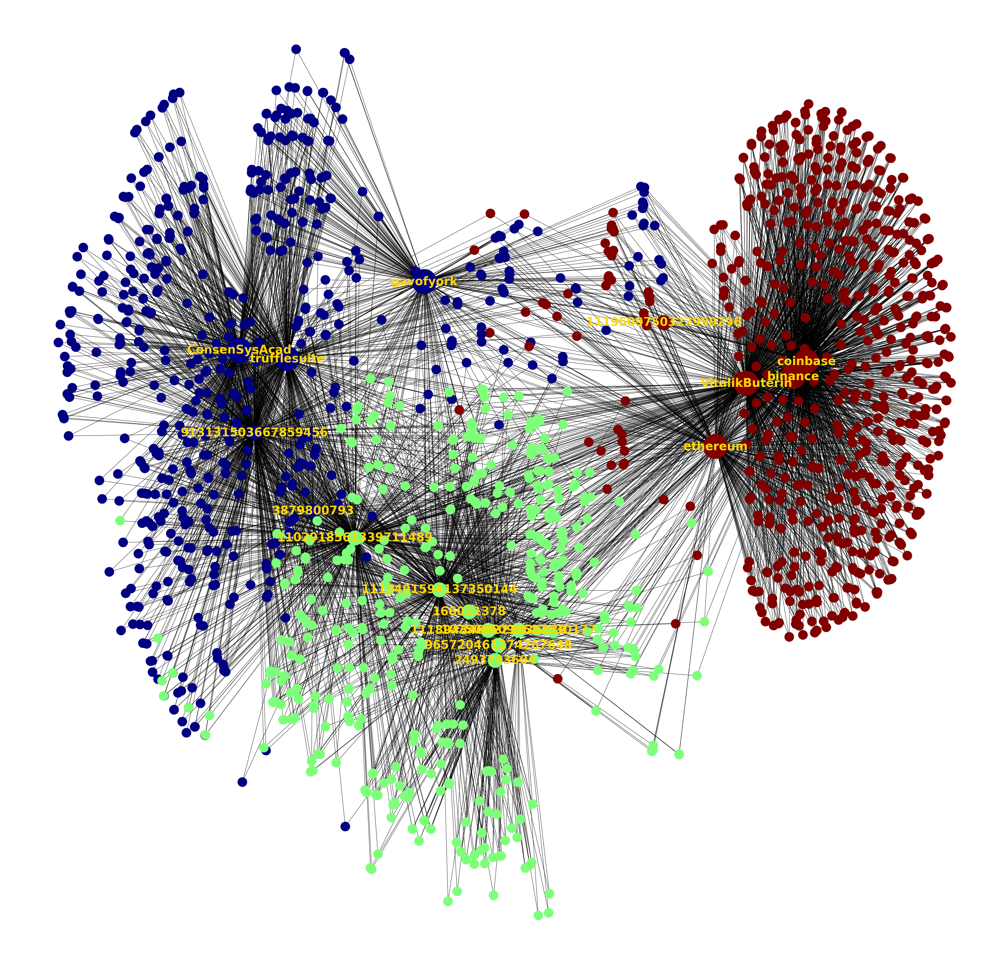

In [10]:
# 4.2 - Community detection using Louvain Algorithm.
print('Louvain Algorithm Clustering:')
filename = '../images/cluster/community_detection_louvian.png'
draw_network_communities(graph, louvian_dict, initial_screen_names, nodes_with_labels, filename)
print_comm_summary(louvian_dict, nodes_with_labels)


Greedy Modularity Clustering:
Partition of main nodes obtained by the Louvain Algorithm:
Total number of partitions 3
Community 0 formed by ['coinbase', '1119509750322999296', 'VitalikButerin', '1075046092612530177', 'binance', 'ethereum']
Community 1 formed by ['1102918561339711489', '1119491594137350144', '2493743604', '3879800793', 'trufflesuite', '166021378', '965720461274267648', '1118943462223536128']
Community 2 formed by ['ConsenSysAcad', 'gavofyork', '913131503667859456']


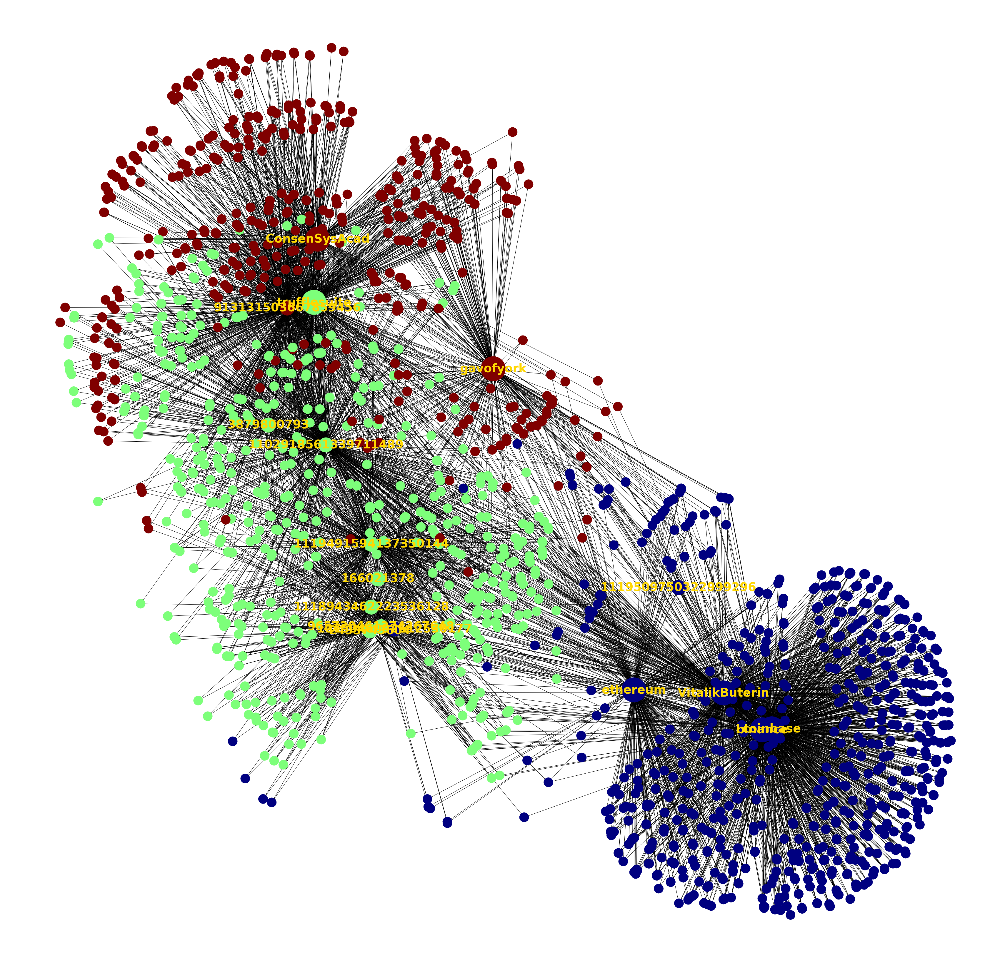

In [11]:
# 4.3 - Community detection using Greedy Modularity.
print('\nGreedy Modularity Clustering:')
filename = '../images/cluster/community-detection-greedy-modularity.png'
draw_network_communities(graph, greedy_mod_dict, initial_screen_names, nodes_with_labels, filename)
print_comm_summary(greedy_mod_dict, nodes_with_labels)